# Physics Loss Investigation Adaptive Physics - Two Stages Approach.

In [2]:
import numpy as np
import pandas as pd
import torch
import torch.optim as optim
import os
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler

import pvlib
from pvlib import location, pvsystem, modelchain
from pvlib.temperature import TEMPERATURE_MODEL_PARAMETERS
import re


In [3]:
import pandas as pd
import re
import numpy as np
from pvlib import location, pvsystem, modelchain
from pvlib.modelchain import ModelChain
from pvlib.temperature import TEMPERATURE_MODEL_PARAMETERS
import os


def get_station_metadata(station_num, df):
    """
    Retrieves and parses metadata for a specific station from the DataFrame.
    
    Args:
        station_num (int or str): The station number (e.g., 5 or '05').
        df (pd.DataFrame): The source dataframe containing station metadata.
        
    Returns:
        dict: A clean dictionary with numerical values ready for simulation.
    """
    
    # 1. Format the station ID
    station_id_str = f"station{str(station_num).zfill(2)}"
    
    # 2. Filter the dataframe
    station_row = df[df['Station_ID'] == station_id_str]
    
    if station_row.empty:
        raise ValueError(f"Station ID {station_id_str} not found in DataFrame.")
    
    # Get the single row as a Series
    row = station_row.iloc[0]

    # --- Helper 1: Parse "Key:Value" blocks (lines separated by \n) ---
    def parse_kv_string(text_block):
        data = {}
        if isinstance(text_block, str):
            for item in text_block.split('\n'):
                if ':' in item:
                    k, v = item.split(':', 1)
                    data[k.strip()] = v.strip()
        return data

    # --- Helper 2: Extract numeric values safely (e.g., "250 Wp" -> 250.0) ---
    def extract_num(val, default=0.0):
        if pd.isna(val): return default
        match = re.search(r"[-+]?\d*\.\d+|\d+", str(val))
        return float(match.group()) if match else default

    # 3. Parse complex text columns into dictionaries
    module_items = parse_kv_string(row.get('Module', ''))
    inverter_items = parse_kv_string(row.get('Inverters', ''))
    layout_items = parse_kv_string(row.get('Layout', ''))

    # 4. Build the final clean dictionary
    # We use extract_num to ensure we pass numbers (floats/ints) to the model, not strings.
    metadata = {
        # --- Identity & Location ---
        'Station_ID': station_id_str,
        'Longitude': float(row['Longitude']),
        'Latitude': float(row['Latitude']),
        'Array_Tilt': row['Array_Tilt'], # Kept as string (e.g., "South 30") for parsing in main model
        
        # --- System Capacity & Dimensions ---
        'Capacity': float(row['Capacity']),          # Total Station Capacity (kW)
        'Panel_Size': float(row.get('Panel_Size', 1.62)), # Panel Area in m^2
        'Total_Panel_Number': int(row.get('Panel_Number', 0)),
        'PV_Technology': row['PV_Technology'],

        # --- Extracted Module Specs (Cleaned to Float) ---
        'Module_Pmax': extract_num(module_items.get('Pmax'), default=250),
        'Module_Vmpp': extract_num(module_items.get('Vmpp'), default=30),
        'Module_Impp': extract_num(module_items.get('Impp'), default=8),
        
        # --- Extracted Inverter Specs (Cleaned to Float) ---
        'Inverter_Rated_Power': extract_num(inverter_items.get('Rated power'), default=500),
        'Inverter_Max_DC_Voltage': extract_num(inverter_items.get('Max. DC voltage'), default=1000),
        
        # --- Extracted Layout Specs (Cleaned to Int) ---
        # Note: Layout strings can look like "modules per string:20"
        'Modules_per_String': int(extract_num(layout_items.get('modules per string'), default=20)),
        'Strings_per_Inverter': int(extract_num(layout_items.get('strings per inverter'), default=100)),
    }
    
    return metadata



def calculate_nwp_power(metadata, df):
    """
    Calculates expected PV Power output (MW) based purely on NWP Weather Forecasts.
    Includes fix for date_time NaN and incorrect index parsing.
    """
    station_id = metadata.get('Station_ID', 'Unknown')
    print(f"--- Calculating NWP Physical Power & Sun Elevation for {station_id} ---")
    
    # ---------------------------------------------------------
    # 1. SETUP LOCATION & TIME
    # ---------------------------------------------------------
    lat = metadata['Latitude']
    lon = metadata['Longitude']
    
    # Define Location (UTC to align with solar position)
    site = location.Location(lat, lon, tz='UTC')
    
    # --- FIX: Robust Datetime Indexing ---
    if not isinstance(df.index, pd.DatetimeIndex):
        # Check if 'date_time' column exists (it does in CSV)
        if 'date_time' in df.columns:
            # FIX: Remove 'format' argument to allow pandas to infer if seconds (00:00:00) exist
            df['date_time'] = pd.to_datetime(df['date_time']) 
            df.set_index('date_time', inplace=True)
        else:
            # Fallback if column is missing
            df.index = pd.to_datetime(df.index)
    elif df.index.tz is None:
        # If it is a DatetimeIndex but naive, localize it
        df.index = df.index.tz_localize('UTC')

    # ---------------------------------------------------------
    # 2. CALCULATE SUN ELEVATION
    # ---------------------------------------------------------
    solpos = site.get_solarposition(df.index)
    df['sun_elevation'] = solpos['elevation']

    # ---------------------------------------------------------
    # 3. PREPARE WEATHER DATA
    # ---------------------------------------------------------
    weather_nwp = pd.DataFrame(index=df.index)
    
    weather_nwp['ghi'] = df['nwp_globalirrad']
    weather_nwp['dni'] = df['nwp_directirrad']
    weather_nwp['temp_air'] = df['nwp_temperature']
    weather_nwp['wind_speed'] = df['nwp_windspeed']
    
    if 'nwp_pressure' in df.columns:
        weather_nwp['pressure'] = df['nwp_pressure'] * 100 
    else:
        weather_nwp['pressure'] = 101325.0

    zenith_rad = np.radians(solpos['zenith'])
    weather_nwp['dhi'] = weather_nwp['ghi'] - (weather_nwp['dni'] * np.cos(zenith_rad))
    
    weather_nwp['dhi'] = weather_nwp['dhi'].clip(lower=0.0)
    weather_nwp['dni'] = weather_nwp['dni'].clip(lower=0.0)
    weather_nwp['ghi'] = weather_nwp['ghi'].clip(lower=0.0)

    # ---------------------------------------------------------
    # 4. DEFINE PV SYSTEM
    # ---------------------------------------------------------
    try:
        tilt_str = str(metadata.get('Array_Tilt'))
        tilt_match = re.search(r"[\d.]+", tilt_str)
        tilt = float(tilt_match.group()) if tilt_match else 33.0
    except:
        tilt = 33.0
        
    module_params = pvsystem.retrieve_sam('CECMod')['Yingli_Energy__China__YL250P_29b']
    
    ivt_para = pvsystem.retrieve_sam('cecinverter')['Advanced_Energy_Industries__Solaron_500kW__3159500_XXXX___480V_']
    ivt_para["Pdco"], ivt_para['Vdco'], ivt_para["Vdcmax"], ivt_para['Idcmax'] = 567000, 315, 1000, 1134
    ivt_para["Mppt_low"], ivt_para['Mppt_high'] = 460, 950
    
    temp_model = TEMPERATURE_MODEL_PARAMETERS['sapm']['open_rack_glass_glass']
    
    system = pvsystem.PVSystem(
        surface_tilt=tilt,
        surface_azimuth=180, 
        module_parameters=module_params,
        inverter_parameters=ivt_para,
        temperature_model_parameters=temp_model,
        modules_per_string=metadata['Modules_per_String'],
        strings_per_inverter=metadata['Strings_per_Inverter']
    )

    # ---------------------------------------------------------
    # 5. RUN PHYSICAL SIMULATION
    # ---------------------------------------------------------
    print("Running ModelChain with NWP Weather...")
    
    mc = ModelChain(system, site, 
                    transposition_model='perez',
                    solar_position_method='nrel_numpy',
                    aoi_model='physical', 
                    spectral_model='no_loss')

    mc.run_model(weather_nwp)
    
    # ---------------------------------------------------------
    # 6. SCALE TO FULL STATION CAPACITY
    # ---------------------------------------------------------
    block_dc_watts = (metadata['Modules_per_String'] * metadata['Strings_per_Inverter'] * metadata['Module_Pmax'])
    station_total_capacity_watts = metadata['Capacity'] * 1000
    
    if block_dc_watts > 0:
        scaling_factor = station_total_capacity_watts / block_dc_watts
    else:
        scaling_factor = 1.0 
        
    nwp_power_mw = (mc.results.ac.fillna(0) * scaling_factor) / 1_000_000
    nwp_power_mw = nwp_power_mw.clip(lower=0.0)
    
    df['NWP_Power_MW'] = nwp_power_mw
    
    print(f"Done. Mean Predicted Power: {nwp_power_mw.mean():.4f} MW | Sun Elevation calculated.")
    
    return df


def calculate_clearsky_indices(metadata, df):
    """
    Calculates both Irradiance (K_CS) and Power (K_PV) Clear Sky Indices.
    Includes fix for date_time NaN caused by strict format mismatch.
    """
    
    print(f"--- Processing {metadata.get('Station_ID', 'Unknown')} ---")
    
    # ---------------------------------------------------------
    # 1. SETUP LOCATION & TIME
    # ---------------------------------------------------------
    lat = metadata['Latitude']
    lon = metadata['Longitude']
    
    site = location.Location(lat, lon, tz='UTC')
    
    # --- FIX: Ensure index is Datetime and Localized to UTC ---
    if not isinstance(df.index, pd.DatetimeIndex):
        # FIX: Remove strict 'format' argument to handle seconds (e.g. 00:00:00)
        df['date_time'] = pd.to_datetime(df['date_time']) 
        df.set_index('date_time', inplace=True)
        
        # FIX: Explicitly localize to UTC
        df.index = df.index.tz_localize('UTC')
    elif df.index.tz is None:
        # If it is a DatetimeIndex but naive, localize it
        df.index = df.index.tz_localize('UTC')
        
    # ---------------------------------------------------------
    # 2. CALCULATE CLEAR SKY IRRADIANCE (GHI_clr)
    # ---------------------------------------------------------
    print("Calculating Clear Sky Irradiance (Ineichen model)...")
    
    cs = site.get_clearsky(df.index, model='ineichen')
    df['GHI_clr'] = cs['ghi']

    if 'lmd_totalirrad' in df.columns:
        meas_ghi = df['lmd_totalirrad']
        df['K_CS_day'] = np.where(
            df['GHI_clr'] > 10, 
            meas_ghi / df['GHI_clr'], 
            0.0
        )
        df['K_CS_dayNight'] = meas_ghi / df['GHI_clr']
        df['K_CS'] = df['K_CS_day']
        df['K_CS'] = df['K_CS'].clip(lower=0.0, upper=1.25)
    else:
        print("Warning: 'lmd_totalirrad' column missing. K_CS not calculated.")

    # ---------------------------------------------------------
    # 3. SETUP PV SYSTEM MODEL (For P_CLR)
    # ---------------------------------------------------------
    try:
        tilt_str = str(metadata.get('Array_Tilt'))
        tilt_match = re.search(r"[\d.]+", tilt_str)
        tilt = float(tilt_match.group()) if tilt_match else 33.0
    except Exception as e:
        print(f"Error extracting tilt: {e} .... Assuming 33 degrees")
        tilt = 33.0
    
    azimuth = 180 

    module_params = pvsystem.retrieve_sam('CECMod')['Yingli_Energy__China__YL250P_29b']
    block_dc_watts = (metadata['Modules_per_String'] * metadata['Strings_per_Inverter'] * metadata['Module_Pmax'])
    
    ivt_para = pvsystem.retrieve_sam('cecinverter')['Advanced_Energy_Industries__Solaron_500kW__3159500_XXXX___480V_']
    ivt_para["Pdco"], ivt_para['Vdco'], ivt_para["Vdcmax"], ivt_para['Idcmax'] = 567000, 315, 1000, 1134
    ivt_para["Mppt_low"], ivt_para['Mppt_high'] = 460, 950
    inverter_parameters = ivt_para
    temp_model = TEMPERATURE_MODEL_PARAMETERS['sapm']['open_rack_glass_glass']
    
    system = pvsystem.PVSystem(
        surface_tilt=tilt,
        surface_azimuth=azimuth,
        module_parameters=module_params,
        inverter_parameters=inverter_parameters,
        temperature_model_parameters=temp_model,
        modules_per_string=metadata['Modules_per_String'],
        strings_per_inverter=metadata['Strings_per_Inverter']
    )

    # ---------------------------------------------------------
    # 4. RUN MODEL CHAIN FOR POWER
    # ---------------------------------------------------------
    print("Running PV Power Simulation...")

    mc = ModelChain(system, site, transposition_model='perez',
                        solar_position_method='nrel_numpy',
                        aoi_model='physical', spectral_model='no_loss')

    mc.run_model(cs)

    # ---------------------------------------------------------
    # 5. SCALE & CALCULATE POWER INDEX (K_PV)
    # ---------------------------------------------------------
    station_total_capacity_watts = metadata['Capacity'] * 1000
    scaling_factor = station_total_capacity_watts / block_dc_watts
    
    p_clr_watts = mc.results.ac.fillna(0) * scaling_factor
    df['P_CLR'] = p_clr_watts / 1_000_000 

    if 'power' in df.columns:
        meas_power = df['power']
        if meas_power.max() > 500:
            meas_power = meas_power / 1000.0
            
        df['K_PV'] = np.where(
            df['P_CLR'] > 1.0, 
            meas_power / df['P_CLR'], 
            0.0
        )
        df['K_PV'] = df['K_PV'].clip(lower=0.0, upper=1.5)
    else:
        print("Warning: 'power' column missing. K_PV not calculated.")

    return df

In [4]:
# ==========================================================
# Real Power PV generated power data.

# read the data for PVOD
abs_path = os.path.abspath("/home/muhammadhassan/App_v02/physics_informed_inves/PVODdatasets_v1")

station07_path = os.path.join(abs_path, "station07.csv")
station07_data = pd.read_csv(station07_path)

metadata_path = os.path.join(abs_path, "metadata.csv")
metaData = pd.read_csv(metadata_path)


station07_metaData = get_station_metadata(7, metaData)
station07_data = pd.read_csv(station07_path)

In [5]:



# 3. Run Calculation
print(station07_metaData)
station07_df = calculate_clearsky_indices(station07_metaData, station07_data)

{'Station_ID': 'station07', 'Longitude': 113.64187, 'Latitude': 36.64403, 'Array_Tilt': 'South 31°', 'Capacity': 20000.0, 'Panel_Size': 1.6335, 'Total_Panel_Number': 80000, 'PV_Technology': 'Poly-Si', 'Module_Pmax': 250.0, 'Module_Vmpp': 29.8, 'Module_Impp': 8.39, 'Inverter_Rated_Power': 500.0, 'Inverter_Max_DC_Voltage': 1000.0, 'Modules_per_String': 20, 'Strings_per_Inverter': 100}
--- Processing station07 ---
Calculating Clear Sky Irradiance (Ineichen model)...
Running PV Power Simulation...


In [6]:
station07_df = calculate_nwp_power(station07_metaData, station07_df)

--- Calculating NWP Physical Power & Sun Elevation for station07 ---


KeyboardInterrupt: 

In [ ]:
def prepare_features(df):
    data = df.copy()
    
    # ---------------------------------------------------------
    # FIX: Convert UTC Index to Local Time (UTC+8)
    # This aligns visual expectations (00:00 = Night, 12:00 = Noon)
    # ---------------------------------------------------------
    if data.index.tzinfo is not None:  # If index is timezone-aware (it is UTC)
        data.index = data.index.tz_convert('Asia/Shanghai')
    else:
        # Fallback: if index somehow became naive, localize as UTC first
        data.index = data.index.tz_localize('UTC').tz_convert('Asia/Shanghai')

    # Now 'data.index' is in Local Time (e.g., Asia/Shanghai)
    
    # 1. Cyclic Encoding for Hour (0-23)
    # This helps the model know that 23:00 is close to 00:00
    data['hour_sin'] = np.sin(2 * np.pi * data.index.hour / 24)
    data['hour_cos'] = np.cos(2 * np.pi * data.index.hour / 24)
    
    # 2. Cyclic Encoding for Day of Year (1-365)
    # This captures seasonality (Summer vs Winter)
    data['day_sin'] = np.sin(2 * np.pi * data.index.dayofyear / 365)
    data['day_cos'] = np.cos(2 * np.pi * data.index.dayofyear / 365)

    # 3. Months
    data['month_sin'] = np.sin(2 * np.pi * data.index.month / 12)
    data['month_cos'] = np.cos(2 * np.pi * data.index.month / 12)

    # seasons 
    data['season_sin'] = np.sin(2 * np.pi * data.index.month / 4)
    data['season_cos'] = np.cos(2 * np.pi * data.index.month / 4)
    
    return data


station07_df = prepare_features(station07_df)




In [ ]:
station07_df.head(85)

,nwp_globalirrad,nwp_directirrad,nwp_temperature,nwp_humidity,nwp_windspeed,nwp_winddirection,nwp_pressure,lmd_totalirrad,lmd_diffuseirrad,lmd_temperature,...,sun_elevation,NWP_Power_MW,hour_sin,hour_cos,day_sin,day_cos,month_sin,month_cos,season_sin,season_cos
date_time,,,,,,,,,,,,,,,,,,,,,
2018-07-01 00:00:00+08:00,0.0,0.0,19.86,61.42,3.49,338.26,930.57,0,0,17.600000,...,-29.822157,0.0,0.000000,1.000000,0.008607,-0.999963,-0.5,-0.866025,-1.0,-4.286264e-16
2018-07-01 00:15:00+08:00,0.0,0.0,19.81,61.22,3.51,339.19,930.51,0,0,17.500000,...,-30.123723,0.0,0.000000,1.000000,0.008607,-0.999963,-0.5,-0.866025,-1.0,-4.286264e-16
2018-07-01 00:30:00+08:00,0.0,0.0,19.76,61.03,3.52,340.19,930.55,0,0,17.299999,...,-30.216974,0.0,0.000000,1.000000,0.008607,-0.999963,-0.5,-0.866025,-1.0,-4.286264e-16
2018-07-01 00:45:00+08:00,0.0,0.0,19.70,60.91,3.53,340.14,930.47,0,0,17.200001,...,-30.100922,0.0,0.000000,1.000000,0.008607,-0.999963,-0.5,-0.866025,-1.0,-4.286264e-16
2018-07-01 01:00:00+08:00,0.0,0.0,19.60,60.89,3.51,339.90,930.19,0,0,17.100000,...,-29.776795,0.0,0.258819,0.965926,0.008607,-0.999963,-0.5,-0.866025,-1.0,-4.286264e-16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-07-01 20:00:00+08:00,0.0,0.0,25.79,40.87,3.66,62.67,927.98,0,0,24.700001,...,-2.898484,0.0,-0.866025,0.500000,0.008607,-0.999963,-0.5,-0.866025,-1.0,-4.286264e-16
2018-07-01 20:15:00+08:00,0.0,0.0,25.39,41.95,3.92,57.59,928.06,0,0,24.799999,...,-5.422650,0.0,-0.866025,0.500000,0.008607,-0.999963,-0.5,-0.866025,-1.0,-4.286264e-16
2018-07-01 20:30:00+08:00,0.0,0.0,25.11,42.78,4.13,55.59,928.17,0,0,25.200001,...,-7.876095,0.0,-0.866025,0.500000,0.008607,-0.999963,-0.5,-0.866025,-1.0,-4.286264e-16


In [ ]:
station07_df.index

DatetimeIndex(['2018-07-01 00:00:00+08:00', '2018-07-01 00:15:00+08:00',
               '2018-07-01 00:30:00+08:00', '2018-07-01 00:45:00+08:00',
               '2018-07-01 01:00:00+08:00', '2018-07-01 01:15:00+08:00',
               '2018-07-01 01:30:00+08:00', '2018-07-01 01:45:00+08:00',
               '2018-07-01 02:00:00+08:00', '2018-07-01 02:15:00+08:00',
               ...
               '2019-06-13 21:30:00+08:00', '2019-06-13 21:45:00+08:00',
               '2019-06-13 22:00:00+08:00', '2019-06-13 22:15:00+08:00',
               '2019-06-13 22:30:00+08:00', '2019-06-13 22:45:00+08:00',
               '2019-06-13 23:00:00+08:00', '2019-06-13 23:15:00+08:00',
               '2019-06-13 23:30:00+08:00', '2019-06-13 23:45:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', length=32928, freq=None)

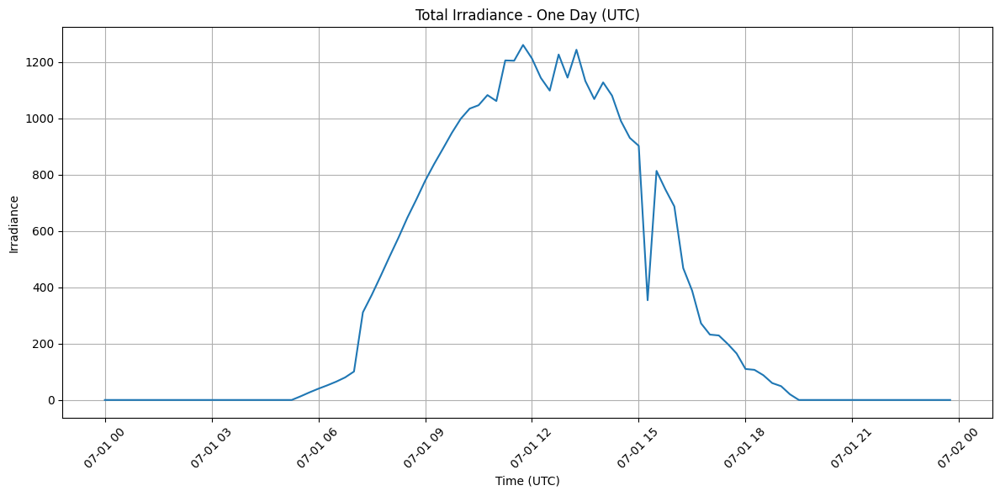

In [ ]:
import matplotlib.pyplot as plt

# Select one day of data

# 24 hours * (60 mins / 15 mins) = 96 records
day_data = station07_df.iloc[:96]

plt.figure(figsize=(12, 6))
plt.plot(day_data.index, day_data['lmd_totalirrad'])

# Formatting the plot
plt.title("Total Irradiance - One Day (UTC)")
plt.xlabel("Time (UTC)")
plt.ylabel("Irradiance")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
station07_df.columns

Index(['nwp_globalirrad', 'nwp_directirrad', 'nwp_temperature', 'nwp_humidity',
       'nwp_windspeed', 'nwp_winddirection', 'nwp_pressure', 'lmd_totalirrad',
       'lmd_diffuseirrad', 'lmd_temperature', 'lmd_pressure',
       'lmd_winddirection', 'lmd_windspeed', 'power', 'GHI_clr', 'K_CS_day',
       'K_CS_dayNight', 'K_CS', 'P_CLR', 'K_PV', 'sun_elevation',
       'NWP_Power_MW', 'hour_sin', 'hour_cos', 'day_sin', 'day_cos',
       'month_sin', 'month_cos', 'season_sin', 'season_cos'],
      dtype='object')

In [ ]:
# ==============================================================================
# CELL 1: Import the Physics-Residual Mamba Module
# ==============================================================================
import sys
sys.path.insert(0, '/home/muhammadhassan/App_v02/physics_informed_inves/PINNS')

from physics_residual_mamba import (
    PhysicsResidualMamba,
    PhysicsResidualMambaConfigs,
    PhysicsPVLoss,
    FeatureScaler,
    compute_scaler_stats,
    run_physics_residual_cv,
    prepare_rolling_folds as prepare_rolling_folds_physics
)

print("✓ Physics-Residual Mamba module imported successfully")

✓ Physics-Residual Mamba module imported successfully


----

=== BENCHMARK START ===

TRAINING BASE MAMBA | Folds: 4
DEBUG: prepare_rolling_folds - X_raw shape: (32928, 29), n_splits=4
DEBUG: Common Features (Bf): 10 ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'NWP_Power_MW', 'hour_sin', 'hour_cos', 'day_sin', 'day_cos', 'season_sin', 'season_cos']
DEBUG: Generator entering Fold 1 loop...
Fold 1: Filtered 53 night/invalid samples. Training on 6344 samples.
  Fold 1/4... Done. RMSE=2.0417
DEBUG: Generator entering Fold 2 loop...
Fold 2: Filtered 53 night/invalid samples. Training on 12929 samples.
  Fold 2/4... Done. RMSE=1.8443
DEBUG: Generator entering Fold 3 loop...
Fold 3: Filtered 53 night/invalid samples. Training on 19514 samples.
  Fold 3/4... Done. RMSE=1.9070
DEBUG: Generator entering Fold 4 loop...
Fold 4: Filtered 53 night/invalid samples. Training on 26099 samples.
  Fold 4/4...

/home/muhammadhassan/App_v02/physics_informed_inves/PINNS/physics_residual_mamba.py:1103: RuntimeWarning: Mean of empty slice
  rmse = np.sqrt(np.nanmean((preds_flat - actuals_flat) ** 2))
/home/muhammadhassan/App_v02/physics_informed_inves/PINNS/physics_residual_mamba.py:1104: RuntimeWarning: Mean of empty slice
  mae = np.nanmean(np.abs(preds_flat - actuals_flat))


 Done. RMSE=nan

TRAINING PHYSICS (BENCHMARK) | Folds: 4
DEBUG: prepare_rolling_folds - X_raw shape: (32928, 29), n_splits=4
DEBUG: Common Features (Bf): 10 ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'NWP_Power_MW', 'hour_sin', 'hour_cos', 'day_sin', 'day_cos', 'season_sin', 'season_cos']
DEBUG: Generator entering Fold 1 loop...
Fold 1: Filtered 53 night/invalid samples. Training on 6344 samples.
  Fold 1... [Ep1 WARMUP: L=27.8365 Val=18.0054 *New Best*] [Ep2 WARMUP: L=17.5668 Val=6.2086 *New Best*] [Ep3 WARMUP: L=12.5519 Val=3.8065 *New Best*] [Ep5 WARMUP: L=12.0782 Val=3.9903]
[WARMUP COMPLETE] Learned Params: Eta=0.796, U0=4.38
 [Ep10 JOINT: L=4.8726 Val=4.7486]
Example early stopping triggered at epoch 10

Reloading Best Model (RMSE=1.3282)...
 Done. RMSE=1.3282 SP=9.7453
DEBUG: Generator entering Fold 2 loop...
Fold 2: Filtered 53 night/invalid samples. Training on 12929 samples.
  Fold 2... [Ep1 WARMUP: L=20.6844 Val=6.2147 *New Best*] [Ep2 WARMUP: L=8.3823 Val=3.953

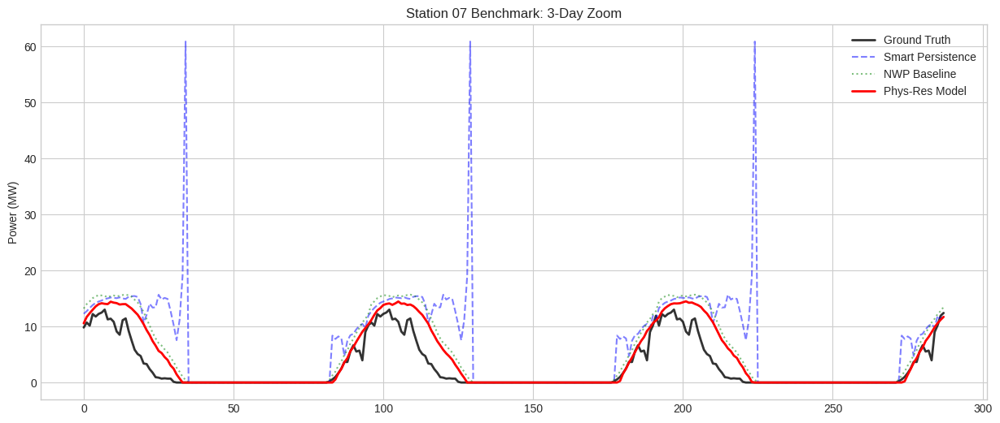

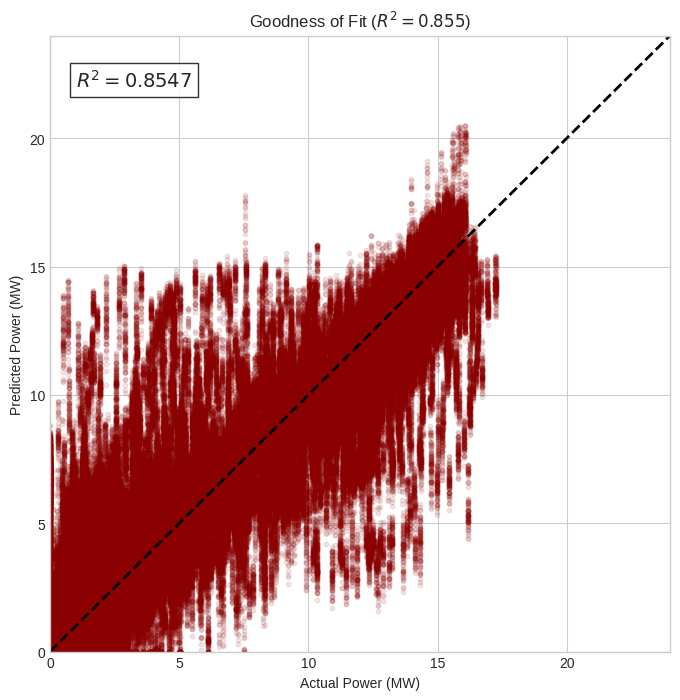

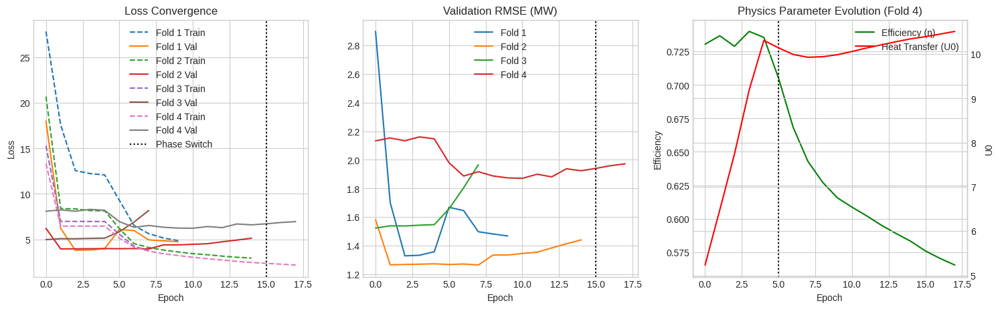

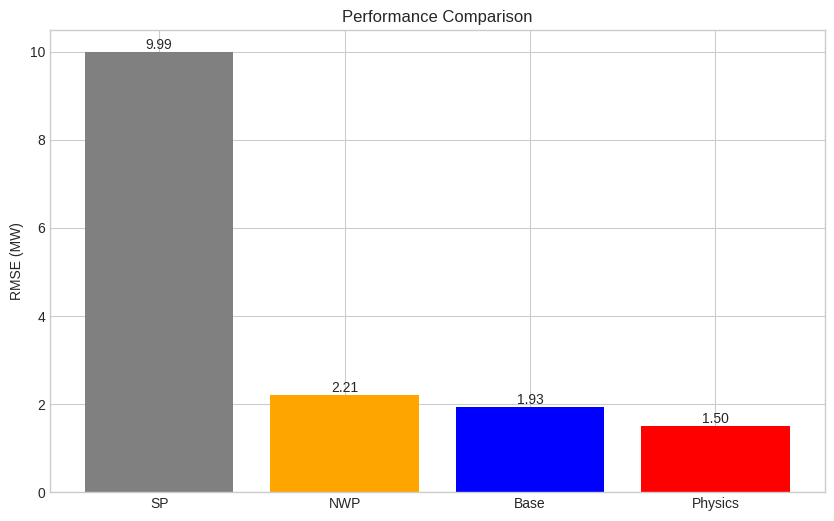

In [ ]:
import sys
import importlib
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1. Reload the library (Important if you just edited it)
import physics_residual_mamba
importlib.reload(physics_residual_mamba)
from physics_residual_mamba import *

# 2. Prepare Data
# Ensure station07_df is loaded from previous cells
df_experiment = station07_df.copy()

n_splits = 4
base_configs = PhysicsResidualMambaConfigs(n_splits=n_splits) 
phys_configs = PhysicsResidualMambaConfigs(n_splits=n_splits)

base_configs.epochs = 50
phys_configs.epochs = 50


configs.experiment_mode = 'v0_base' 
base_results, phys_results = run_full_benchmark(
      df_experiment, 
      base_configs, 
      phys_configs,  
      n_splits=n_splits
)

>>> Running 7-Way Comparative Benchmark (Target: K_PV, Persistent Rolling)
Using Custom Configuration Provided by User
DEBUG: Using Total Epochs=30, Warmup=15
DEBUG: df.index is DatetimeIndex. Range: 2018-07-01 00:00:00+08:00 to 2019-06-13 23:45:00+08:00
DEBUG: Fold 1 - test_index head: DatetimeIndex(['2018-09-07 15:00:00+08:00', '2018-09-07 15:15:00+08:00',
               '2018-09-07 15:30:00+08:00', '2018-09-07 15:45:00+08:00',
               '2018-09-07 16:00:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)
DEBUG: Fold 1 - test_index tail: DatetimeIndex(['2018-11-15 04:00:00+08:00', '2018-11-15 04:15:00+08:00',
               '2018-11-15 04:30:00+08:00', '2018-11-15 04:45:00+08:00',
               '2018-11-15 05:00:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)

=== Fold 1/4 ===
Train: 2018-07-01 00:00:00+08:00 -> 2018-09-07 14:45:00+08:00
Test : 2018-09-07 15:00:00+08:00 -> 2018-11-15 05:00:

DEBUG: Fold 2 - test_index head: DatetimeIndex(['2018-11-15 05:15:00+08:00', '2018-11-15 05:30:00+08:00',
               '2018-11-15 05:45:00+08:00', '2018-11-15 06:00:00+08:00',
               '2018-11-15 06:15:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)
DEBUG: Fold 2 - test_index tail: DatetimeIndex(['2019-01-22 18:15:00+08:00', '2019-01-22 18:30:00+08:00',
               '2019-01-22 18:45:00+08:00', '2019-01-22 19:00:00+08:00',
               '2019-01-22 19:15:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)

=== Fold 2/4 ===
Train: 2018-07-01 00:00:00+08:00 -> 2018-11-15 05:00:00+08:00
Test : 2018-11-15 05:15:00+08:00 -> 2019-01-22 19:15:00+08:00
Training Vanilla Mamba... Done. RMSE: 1.488 MW | nRMSE: 7.44% | Time: 71.7s
Training Base Power Mamba... Done. RMSE: 1.526 MW | nRMSE: 7.63% | Time: 75.0s
Training Physics V02 (Basic)... Done. RMSE: 1.383 MW | nRMSE: 6.91% | Time: 67.1s
Training 

DEBUG: Fold 3 - test_index head: DatetimeIndex(['2019-01-22 19:30:00+08:00', '2019-01-22 19:45:00+08:00',
               '2019-01-22 20:00:00+08:00', '2019-01-22 20:15:00+08:00',
               '2019-01-22 20:30:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)
DEBUG: Fold 3 - test_index tail: DatetimeIndex(['2019-04-06 08:30:00+08:00', '2019-04-06 08:45:00+08:00',
               '2019-04-06 09:00:00+08:00', '2019-04-06 09:15:00+08:00',
               '2019-04-06 09:30:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)

=== Fold 3/4 ===
Train: 2018-07-01 00:00:00+08:00 -> 2019-01-22 19:15:00+08:00
Test : 2019-01-22 19:30:00+08:00 -> 2019-04-06 09:30:00+08:00
Training Vanilla Mamba... Done. RMSE: 2.380 MW | nRMSE: 11.90% | Time: 108.0s
Training Base Power Mamba... Done. RMSE: 2.254 MW | nRMSE: 11.27% | Time: 105.9s
Training Physics V02 (Basic)... Done. RMSE: 1.944 MW | nRMSE: 9.72% | Time: 95.3s
Train

DEBUG: Fold 4 - test_index head: DatetimeIndex(['2019-04-06 09:45:00+08:00', '2019-04-06 10:00:00+08:00',
               '2019-04-06 10:15:00+08:00', '2019-04-06 10:30:00+08:00',
               '2019-04-06 10:45:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)
DEBUG: Fold 4 - test_index tail: DatetimeIndex(['2019-06-13 22:45:00+08:00', '2019-06-13 23:00:00+08:00',
               '2019-06-13 23:15:00+08:00', '2019-06-13 23:30:00+08:00',
               '2019-06-13 23:45:00+08:00'],
              dtype='datetime64[ns, Asia/Shanghai]', name='date_time', freq=None)

=== Fold 4/4 ===
Train: 2018-07-01 00:00:00+08:00 -> 2019-04-06 09:30:00+08:00
Test : 2019-04-06 09:45:00+08:00 -> 2019-06-13 23:45:00+08:00
Training Vanilla Mamba... Done. RMSE: 2.084 MW | nRMSE: 10.42% | Time: 140.1s
Training Base Power Mamba... Done. RMSE: 2.324 MW | nRMSE: 11.62% | Time: 142.7s
Training Physics V02 (Basic)... Done. RMSE: 2.044 MW | nRMSE: 10.22% | Time: 123.2s
Tra


>>> FINAL RESULTS (Average across folds) <<<
Vanilla Mamba: RMSE=1.937 | nRMSE=9.69%
Base Power Mamba: RMSE=2.027 | nRMSE=10.14%
Physics V02 (Basic): RMSE=1.763 | nRMSE=8.82%
Physics V03 (Geo): RMSE=1.800 | nRMSE=9.00%
Physics V04 (Robust): RMSE=1.770 | nRMSE=8.85%
Smart Persistence: RMSE=2.283 | nRMSE=11.41%
NWP Baseline: RMSE=2.215 | nRMSE=11.07%
Physics Pure: RMSE=1.696 | nRMSE=8.48%


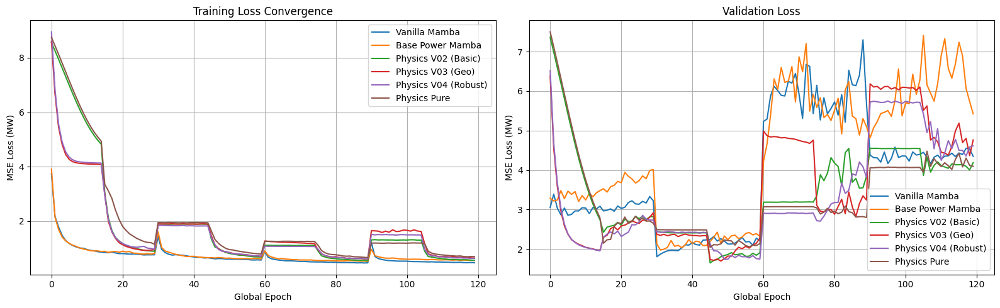

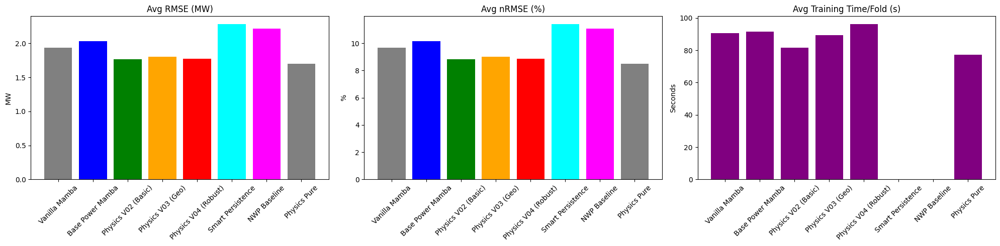

In [ ]:
# ==============================================================================
# CELL 3: Configure Models for Comparison
# ==============================================================================

class BaseMambaConfigs:
    """Configuration for base Power Mamba (no physics)."""
    def __init__(self):
        self.seq_len = 288
        self.pred_len = 96
        
        self.TARGET_COL = ['K_PV'] 
        
        self.PAST_INPUT_COLS = ['lmd_totalirrad',
       'lmd_diffuseirrad', 'lmd_temperature', 'nwp_globalirrad',
            'nwp_temperature','P_CLR', 
            'nwp_windspeed', 'power', 'K_PV', 'hour_sin',
       'hour_cos', 'day_sin', 'day_cos', 'month_sin', 'month_cos',
       'season_sin', 'season_cos', 'NWP_Power_MW', 'K_CS'
        ]
        
        self.FUTURE_INPUT_COLS = ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'hour_sin',
       'hour_cos', 'day_sin', 'day_cos', 'month_sin', 'month_cos','NWP_Power_MW',
       'season_sin', 'season_cos', 'K_CS']
        
        self.common_features = [f for f in self.FUTURE_INPUT_COLS if f in self.PAST_INPUT_COLS]
        self.num_shadows = len(self.common_features)
        self.include_pred = 1
        self.enc_in = len(self.PAST_INPUT_COLS) + self.num_shadows
        self.c_out = 1
        
        # Model hyperparameters
        self.kernel_size = 25
        self.n_embed = 128
        self.d_state = 64
        self.dconv = 2
        self.e_fact = 2 
        self.dropout = 0.2 
        
        # Training
        self.n_splits = 4
        self.batch_size = 32
        self.epochs = 5
        
        # Device
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# Run Comparative Benchmark
# This will:
# 1. Train the V0 Model (Target=Power)
# 2. Train the V02 Model (Target=K_PV)
# 3. Report RMSE (MW) for both on the same data splits
# 4. Print the % improvement
  
import physics_residual_mamba_v02 as v02


# Instantiate your config
my_config = BaseMambaConfigs()
my_config.epochs = 30  # Override as needed
# Run benchmark with your config

my_config.warmup_epochs = 15
df_experiment = station07_df.copy()
results = v02.run_comparative_benchmark(
    df_experiment, 
    n_splits=4, 
    custom_config=my_config
)

---

In [ ]:
# ==========================================================
# STEP 1: Load Station 08 Data (same process as Station 07)
# ==========================================================

station08_path = os.path.join(abs_path, "station08.csv")
station08_data = pd.read_csv(station08_path)

station08_metaData = get_station_metadata(8, metaData)

# Calculate clearsky indices and NWP power for Station 08
station08_df = calculate_clearsky_indices(station08_metaData, station08_data)
station08_df = calculate_nwp_power(station08_metaData, station08_df)
station08_df = prepare_features(station08_df)

# ==========================================================
# STEP 2: Rename Station 08 columns with 's08_' prefix
# ==========================================================

# Columns to rename (NWP features and K_PV from Station 08)
s08_rename_cols = {
    'nwp_globalirrad': 's08_nwp_globalirrad',
    'nwp_temperature': 's08_nwp_temperature',
    'nwp_windspeed': 's08_nwp_windspeed',
    'K_PV': 's08_K_PV',
}

# Create a subset with renamed columns
station08_spatial = station08_df[list(s08_rename_cols.keys())].rename(columns=s08_rename_cols)

# ==========================================================
# STEP 3: Merge on DateTime Index
# ==========================================================

# Both dataframes should have the same DatetimeIndex after prepare_features()
merged_df = station07_df.copy()

# Join Station 08 features
merged_df = merged_df.join(station08_spatial, how='inner')

# ==========================================================
# STEP 4: Calculate Spatial Deltas (Station07 - Station08)
# ==========================================================

merged_df['spatial_delta_irrad'] = merged_df['nwp_globalirrad'] - merged_df['s08_nwp_globalirrad']
merged_df['spatial_delta_temp'] = merged_df['nwp_temperature'] - merged_df['s08_nwp_temperature']
merged_df['spatial_delta_wind'] = merged_df['nwp_windspeed'] - merged_df['s08_nwp_windspeed']

# ==========================================================
# STEP 5: Verify Columns
# ==========================================================

print("=== Merged DataFrame Columns ===")
print(f"Total columns: {len(merged_df.columns)}")
print(f"Station 07 columns: {[c for c in merged_df.columns if not c.startswith('s08_') and not c.startswith('spatial_')]}")
print(f"Station 08 columns: {[c for c in merged_df.columns if c.startswith('s08_')]}")
print(f"Spatial deltas: {[c for c in merged_df.columns if c.startswith('spatial_')]}")
print(f"\nShape: {merged_df.shape}")

# ==========================================================
# STEP 6: Run Spatial Benchmark
# ==========================================================

from physics_residual_mamba_spatial_v02 import run_comparative_benchmark, SpatialMambaConfigs


class SpatialMambaConfigs:
    def __init__(self, n_splits=4):
        self.seq_len = 288
        self.pred_len = 96
        self.TARGET_COL = ['K_PV']
        self.PAST_INPUT_COLS = ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'power', 'K_PV', 'P_CLR', 'NWP_Power_MW', 'hour_sin', 'hour_cos', 'sun_elevation', 'K_CS', 's08_nwp_globalirrad', 's08_nwp_temperature', 's08_nwp_windspeed', 's08_K_PV', 'spatial_delta_irrad', 'spatial_delta_temp', 'spatial_delta_wind']
        self.FUTURE_INPUT_COLS = ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'NWP_Power_MW', 'hour_sin', 'hour_cos', 'sun_elevation', 'K_CS', 's08_nwp_globalirrad', 's08_nwp_temperature', 's08_nwp_windspeed', 'spatial_delta_irrad', 'spatial_delta_temp', 'spatial_delta_wind']
        st07_future_cols = ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'NWP_Power_MW', 'hour_sin', 'hour_cos', 'sun_elevation']
        self.st07_indices = [self.FUTURE_INPUT_COLS.index(c) for c in st07_future_cols]
        self.st07_future_cols = st07_future_cols
        
        self.common_features = [f for f in self.FUTURE_INPUT_COLS if f in self.PAST_INPUT_COLS]
        self.num_shadows = len(self.common_features)
        self.enc_in = len(self.PAST_INPUT_COLS) + self.num_shadows
        self.c_out = 1
        
        self.kernel_size = 25
        self.n_embed = 128
        self.d_state = 64
        self.dconv = 2
        self.e_fact = 2
        self.dropout = 0.2
        self.n_splits = n_splits
        self.batch_size = 64
        self.epochs = 30
        self.warmup_epochs = 5
        # Loss params
        self.T_ref = 25.0
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        

# Configure with same warmup as V02
my_spatial_config = SpatialMambaConfigs(n_splits=4)
my_spatial_config.warmup_epochs = 25 
my_spatial_config.epochs = 50
# Run Benchmark
results_spatial = run_comparative_benchmark(
    merged_df, 
    n_splits=4, 
    custom_config=my_spatial_config
)

--- Processing station08 ---
Calculating Clear Sky Irradiance (Ineichen model)...
Running PV Power Simulation...
--- Calculating NWP Physical Power & Sun Elevation for station08 ---
Running ModelChain with NWP Weather...
Done. Mean Predicted Power: 2.7035 MW | Sun Elevation calculated.
=== Merged DataFrame Columns ===
Total columns: 37
Station 07 columns: ['nwp_globalirrad', 'nwp_directirrad', 'nwp_temperature', 'nwp_humidity', 'nwp_windspeed', 'nwp_winddirection', 'nwp_pressure', 'lmd_totalirrad', 'lmd_diffuseirrad', 'lmd_temperature', 'lmd_pressure', 'lmd_winddirection', 'lmd_windspeed', 'power', 'GHI_clr', 'K_CS_day', 'K_CS_dayNight', 'K_CS', 'P_CLR', 'K_PV', 'sun_elevation', 'NWP_Power_MW', 'hour_sin', 'hour_cos', 'day_sin', 'day_cos', 'month_sin', 'month_cos', 'season_sin', 'season_cos']
Station 08 columns: ['s08_nwp_globalirrad', 's08_nwp_temperature', 's08_nwp_windspeed', 's08_K_PV']
Spatial deltas: ['spatial_delta_irrad', 'spatial_delta_temp', 'spatial_delta_wind']

Shape: (326

----

In [ ]:
# ... (Your Data Preparation Steps 1-5 remain exactly the same) ...

# ==========================================================
# STEP 6: Run V05 Benchmark (No Wavelet)
# ==========================================================

# 1. IMPORT from the NEW V05 file
from physics_residual_mamba_spatial_v05 import run_comparative_benchmark, SpatialMambaConfigs

class SpatialMambaConfigs:
    def __init__(self, n_splits=4):
        self.seq_len = 288
        self.pred_len = 96
        self.TARGET_COL = ['K_PV']
        self.PAST_INPUT_COLS = ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'power', 'K_PV', 'P_CLR', 'NWP_Power_MW', 'hour_sin', 'hour_cos', 'sun_elevation', 'K_CS', 's08_nwp_globalirrad', 's08_nwp_temperature', 's08_nwp_windspeed', 's08_K_PV', 'spatial_delta_irrad', 'spatial_delta_temp', 'spatial_delta_wind']
        self.FUTURE_INPUT_COLS = ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'NWP_Power_MW', 'hour_sin', 'hour_cos', 'sun_elevation', 'K_CS', 's08_nwp_globalirrad', 's08_nwp_temperature', 's08_nwp_windspeed', 'spatial_delta_irrad', 'spatial_delta_temp', 'spatial_delta_wind']
        st07_future_cols = ['nwp_globalirrad', 'nwp_temperature', 'nwp_windspeed', 'NWP_Power_MW', 'hour_sin', 'hour_cos', 'sun_elevation']
        self.st07_indices = [self.FUTURE_INPUT_COLS.index(c) for c in st07_future_cols]
        self.st07_future_cols = st07_future_cols
        
        self.common_features = [f for f in self.FUTURE_INPUT_COLS if f in self.PAST_INPUT_COLS]
        self.num_shadows = len(self.common_features)
        self.enc_in = len(self.PAST_INPUT_COLS) + self.num_shadows
        self.c_out = 1
        
        self.kernel_size = 25
        self.n_embed = 128
        self.d_state = 64
        self.dconv = 2
        self.e_fact = 2
        self.dropout = 0.2
        self.n_splits = n_splits
        self.batch_size = 64
        self.epochs = 30
        self.warmup_epochs = 5
        # Loss params
        self.T_ref = 25.0
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        
# 2. Configure
my_spatial_config = SpatialMambaConfigs(n_splits=2)
my_spatial_config.warmup_epochs = 25
my_spatial_config.epochs = 50

# 3. Run Benchmark
# This will automatically run:
# - Vanilla Mamba
# - Base Power Mamba
# - Physics V04 (Robust)
# - Physics V05 (Hyper-Robust)
# - Smart Persistence
# - NWP Baseline
results_spatial = run_comparative_benchmark(
    merged_df, 
    n_splits=2, 
    custom_config=my_spatial_config
) 

>>> Running V05 Benchmark (No Wavelet, Fixed Loss, Adaptive Removed)

=== Fold 1/2 ===
Training Vanilla Mamba... RMSE: 1.000 MW | nRMSE: 5.00%
Training Base Power Mamba... RMSE: 0.970 MW | nRMSE: 4.85%
Training Physics V04 (Robust)... RMSE: 0.942 MW | nRMSE: 4.71%
Training Physics V05 (Hyper-Robust)... RMSE: 1.025 MW | nRMSE: 5.12%
Training Smart Persistence... RMSE: 1.968 MW | nRMSE: 9.84%
Training NWP Baseline... RMSE: 2.446 MW | nRMSE: 12.23%

=== Fold 2/2 ===
Training Vanilla Mamba... RMSE: 1.256 MW | nRMSE: 6.28%
Training Base Power Mamba... RMSE: 1.259 MW | nRMSE: 6.29%
Training Physics V04 (Robust)... RMSE: 1.271 MW | nRMSE: 6.36%
Training Physics V05 (Hyper-Robust)... RMSE: 1.319 MW | nRMSE: 6.60%
Training Smart Persistence... RMSE: 2.660 MW | nRMSE: 13.30%
Training NWP Baseline... RMSE: 2.145 MW | nRMSE: 10.73%

>>> FINAL RESULTS <<<
Vanilla Mamba: RMSE=1.128 | nRMSE=5.64%
Base Power Mamba: RMSE=1.115 | nRMSE=5.57%
Physics V04 (Robust): RMSE=1.107 | nRMSE=5.53%
Physics V05 (Hy

----

Loading Metadata...
Loading Station 07 from /home/muhammadhassan/App_v02/physics_informed_inves/PVODdatasets_v1/station07.csv...
Pre-processing Station 07...
--- Processing station07 ---
Calculating Clear Sky Irradiance (Ineichen model)...
Setting up PV System Model...
Running PV Power Simulation...
--- Calculating NWP Physical Power for station07 ---
Running ModelChain with NWP Weather...
Adding Sun Elevation...
Loading Station 08 from /home/muhammadhassan/App_v02/physics_informed_inves/PVODdatasets_v1/station08.csv...
Pre-processing Station 08...
--- Processing station08 ---
Calculating Clear Sky Irradiance (Ineichen model)...
Setting up PV System Model...
Running PV Power Simulation...
--- Calculating NWP Physical Power for station08 ---
Running ModelChain with NWP Weather...
Merging Spatial Data...
Final Merged Shape: (32640, 35)

RUNNING SPATIAL BENCHMARK
>>> Running V05 Benchmark (No Wavelet, Fixed Loss, Adaptive Removed)
Loading metadata from /home/muhammadhassan/App_v02/physics

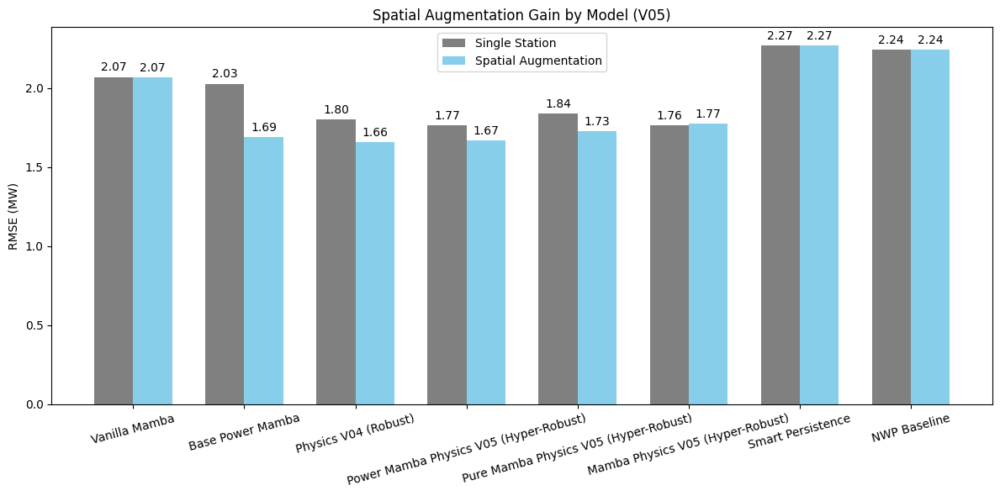

In [1]:
from v05_experiment_runner import main as v05_main
v05_main()

----